In [1]:
%matplotlib nbagg

In [2]:
import numpy as np
import matplotlib.pyplot as plt

In [3]:
import msaf

In [4]:
import librosa
import librosa.display
import mir_eval
import mir_eval.display

In [5]:
FILE = '/home/bmcfee/data/beatles_iso/audio/beatles/11_-_Abbey_Road/01_-_Come_Together.flac'

In [6]:
y, sr = librosa.load(FILE)

In [7]:
BPO = 12 * 3

In [8]:
Cmag = np.abs(librosa.cqt(y=y, sr=sr, bins_per_octave=BPO, n_bins=7*BPO))

---
# Estimate boundaries using the MSAF default methods

In [52]:
boundaries, labels = msaf.process(FILE, labels_id='scluster', boundaries_id='sf', feature='pcp')

In [ ]:
msaf.eval.

In [53]:
intervals = mir_eval.util.boundaries_to_intervals(boundaries)

<IPython.core.display.Javascript object>


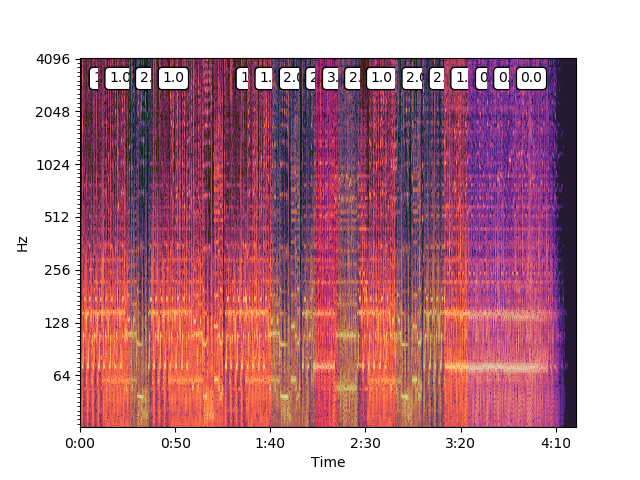

In [54]:
plt.figure()
librosa.display.specshow(librosa.amplitude_to_db(Cmag, ref=np.max),
                         x_axis='time', y_axis='cqt_hz', bins_per_octave=BPO)
mir_eval.display.segments(intervals, labels, alpha=0.25, text=True);

# Sonify the boundaries

In [47]:
y_bound = librosa.clicks(boundaries, sr=sr, click_duration=0.7, click_freq=880.0, length=len(y))

In [48]:
from IPython.display import Audio

In [49]:
Audio(data=y+y_bound, rate=sr)

---
# What about other methods?

In [50]:
msaf.features_registry

{'cqt': msaf.features.CQT,
 'mfcc': msaf.features.MFCC,
 'pcp': msaf.features.PCP,
 'tempogram': msaf.features.Tempogram,
 'tonnetz': msaf.features.Tonnetz}

In [51]:
msaf.get_all_boundary_algorithms()

['example', 'olda', 'scluster', 'cnmf', 'sf', 'foote', 'vmo']

In [ ]:
msaf.algorithms.sf.Segmenter()

In [18]:
msaf.get_all_label_algorithms()

['scluster', 'fmc2d', 'cnmf', 'vmo']